# ggF Offline - Limit Plots

This notebook plots:

- 1D Brazil limit plots which show the observed and expected xsection limits as a function of $m_s$ for a given $m_{\phi}$, T and decay mode.  
- 2D limit plot of the observed excluded mu value as a function of $m_{\phi}$ (x-axis) and T (y-axis). 
- Summary plots: showing the $\mu=1$ exclusion limit for every value of $m_s$ and decay mode.

Using functions in `plot_utils.py`.

Use the Outline to navigate to the desired section.

In [1]:
%config InlineBackend.figure_format = 'retina'
import os
import matplotlib.pyplot as plt
import plot_utils as utils

plt.style.use('physics.mplstyle')

import mplhep as hep
hep.style.use("CMS")

In [2]:
# parameters
itag = '../approval_higherPrecision/'

outDir = '/home/submit/{}/public_html/SUEP/limits/debug/'.format(os.environ['USER'])
outDirAN = '/home/submit/{}/SUEP/AN-22-133/images/offline/'.format(os.environ['USER'])
outDirPaper = '/home/submit/{}/SUEP/EXO-23-002/'.format(os.environ['USER'])
outDirSupp = '/home/submit/{}/SUEP/EXO-23-002/supplementary/'.format(os.environ['USER'])

saveToAN = False
saveToPaper = False

if not os.path.isdir(outDir): os.mkdir(outDir)

In [3]:
limits_old = utils.get_scan_limits(path='../approval_higherPrecision/', temp=3, mphi=3, decay='generic', method='HybridNew')
limits_new = utils.get_scan_limits(path='../ggF_allEras/', temp=3, mphi=3, decay='generic', method='HybridNew')

Text(1, 0, '$m_S$ [GeV]')

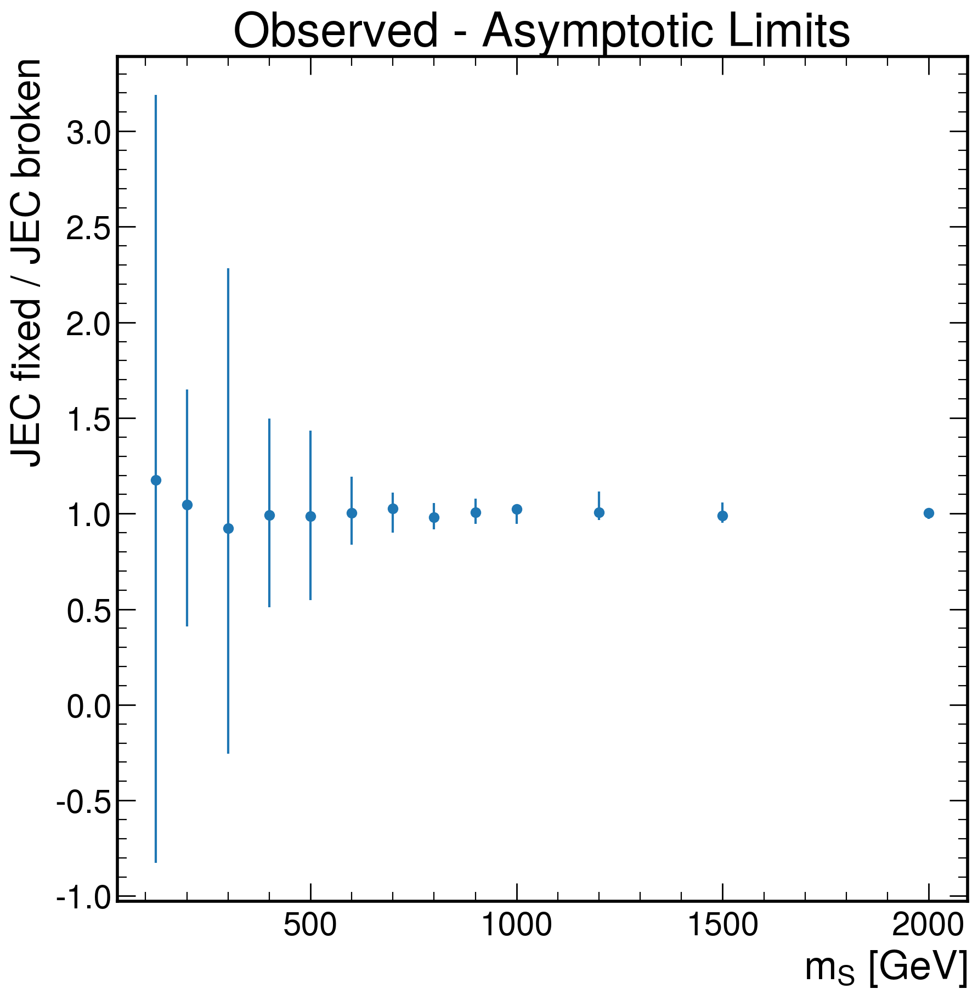

In [4]:
import numpy as np

def get(limits):
    masses = np.array([l[0][0] for l in limits])
    _exp = np.array([l[1][1][2] for l in limits])
    _s1p = np.array([l[1][1][1] for l in limits]) 
    _s1m = np.array([l[1][1][3] for l in limits]) 
    _s2p = np.array([l[1][1][0] for l in limits]) 
    _s2m = np.array([l[1][1][4] for l in limits]) 
    _obs = np.array([l[1][1][5] for l in limits])  
    return masses, _exp, _s1p, _s1m, _s2p, _s2m, _obs

masses, exp_old, s1p_old, s1m_old, s2p_old, s2m_old, obs_old = get(limits_old)
masses, exp_new, s1p_new, s1m_new, s2p_new, s2m_new, obs_new = get(limits_new)

# plot ratios of old vs new limits
fig = plt.figure()
ax = fig.subplots()
ax.scatter(masses, obs_new/obs_old, label='exp ratio')
err_up = np.sqrt((s1p_new - obs_new)**2 * obs_old**-2 + obs_new**2 * obs_old**-4 * (obs_old - s1m_old)**2)
err_down = np.sqrt((s1m_new - obs_new)**2 * obs_old**-2 + obs_new**2 * obs_old**-4 * (obs_old - s1p_old)**2)
ax.errorbar(masses, obs_new/obs_old, yerr=[err_down, err_up], fmt='', linestyle='')
ax.set_title("Observed - Asymptotic Limits")
ax.set_ylabel('JEC fixed / JEC broken')
ax.set_xlabel("$m_S$ [GeV]")
# ax.set_ylim(0.95, 1.05)

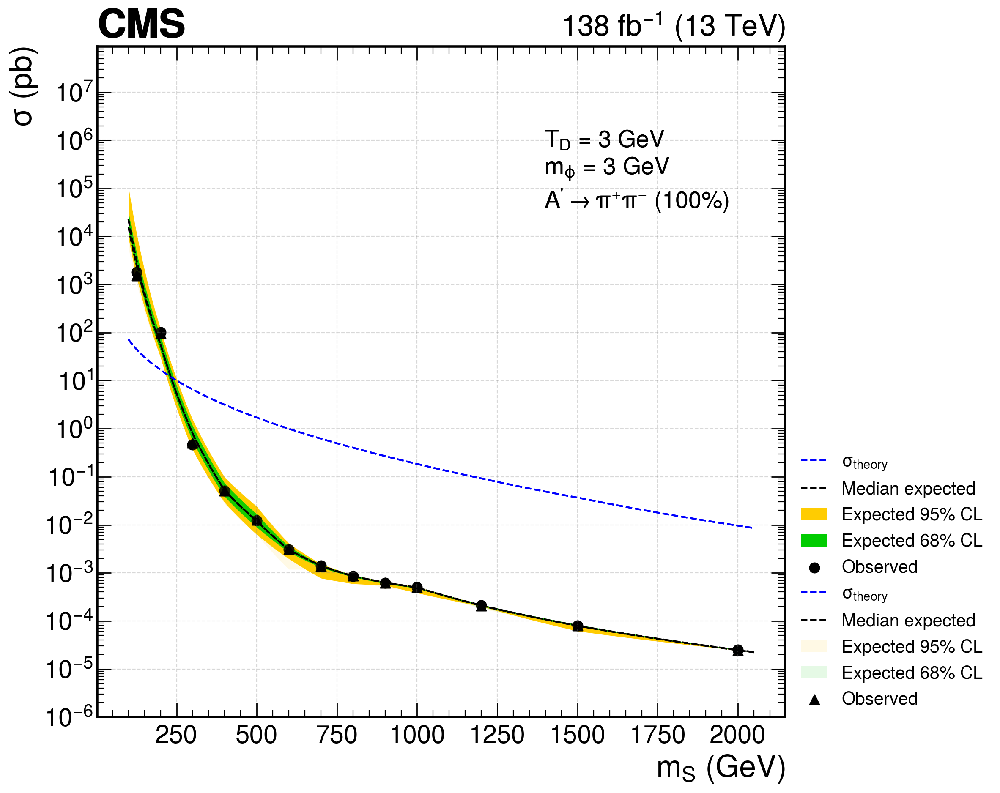

In [6]:
fig = utils.plot_ms_limits(temp=3, mphi=3, decay='generic', path='../ggF_allEras/', verbose=False, method='HybridNew')
ax = utils.plot_ms_limits(temp=3, mphi=3, decay='generic', path='../approval_higherPrecision/', verbose=False, method='HybridNew', ax=fig.axes[0], obs_marker='^', exp_alpha=0.1)

_ = ax.legend(fontsize='xx-small', loc=(1.01, 0))


## 1D Limits: $m_S$ scan

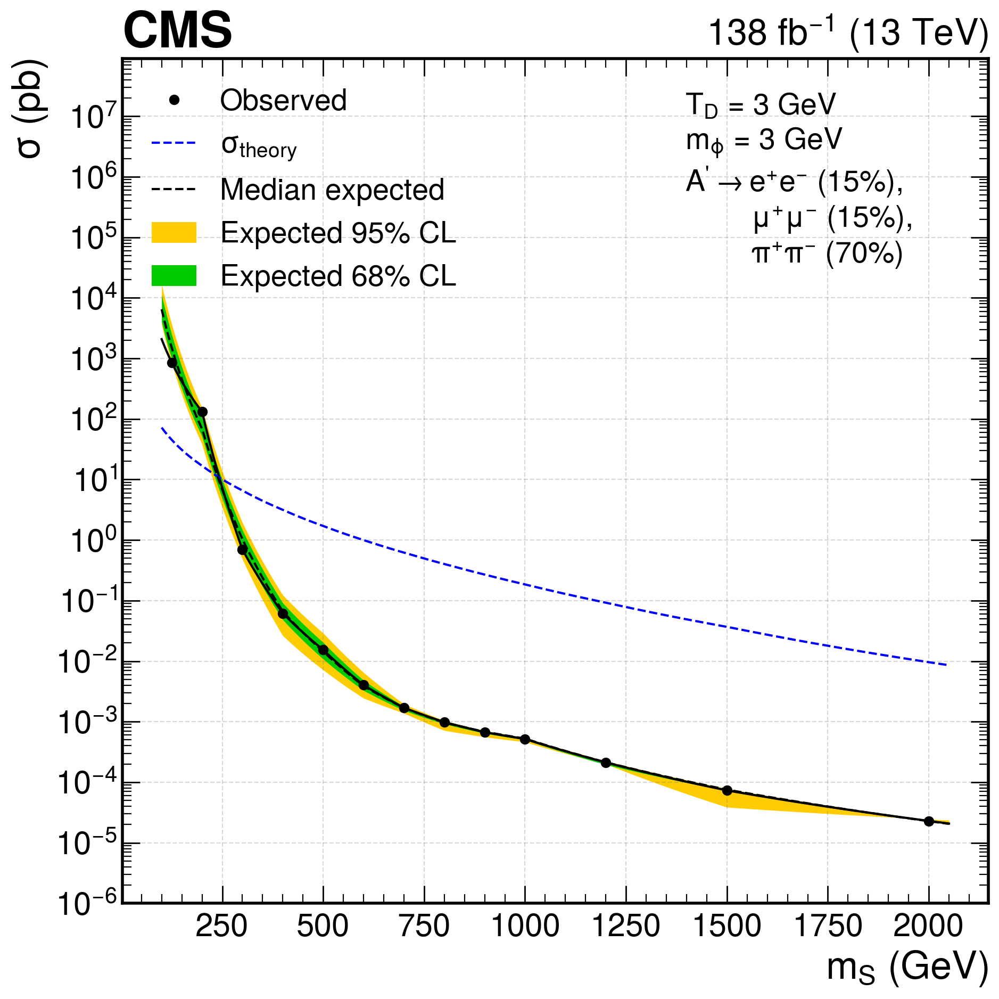

In [12]:
# example usage of the 1D limits mS scan
fig = utils.plot_ms_limits(temp=3, mphi=3, decay='hadronic', path=itag, verbose=False, method='HybridNew')
# fig.axes[0].set_ylim(1e-4, 1e-3)
#fig.axes[0].set_ylim(1e-4, 1e-2)
#utils.savefig(fig, outDir)

In [4]:
# return all combinations of (mphi, temp, decay)
combinations = utils.get_unique_combinations(['ms'])

# plot all combinations, and save the plots
for i, combination in enumerate(combinations):
    try:
        fig = utils.plot_ms_limits(temp=combination[1], mphi=combination[0], decay=combination[2], verbose=False, path=itag, method='HybridNew')
    except Exception as e:
        print("Combination failed", e)
    utils.savefig(fig, outDir)
    if saveToAN: utils.savefig(fig, outDirAN)
    if saveToPaper: utils.savefig(fig, outDirPaper)
    
    # toggle this if you're running many plots that you only want to save
    plt.close()

'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None
'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None
'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None
'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None
'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None
'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None
'path' must be a string, pathlib.P

## 1D Limits: $m_S$ scan, all decay modes

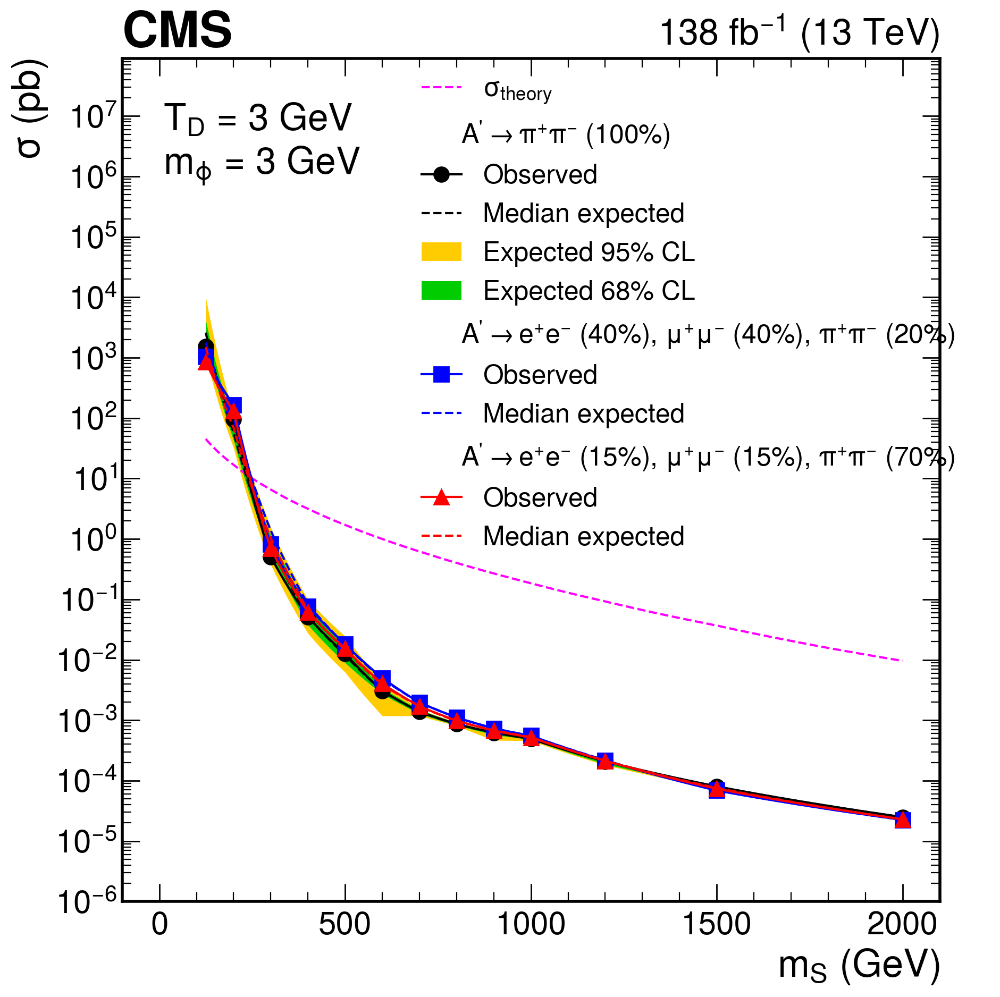

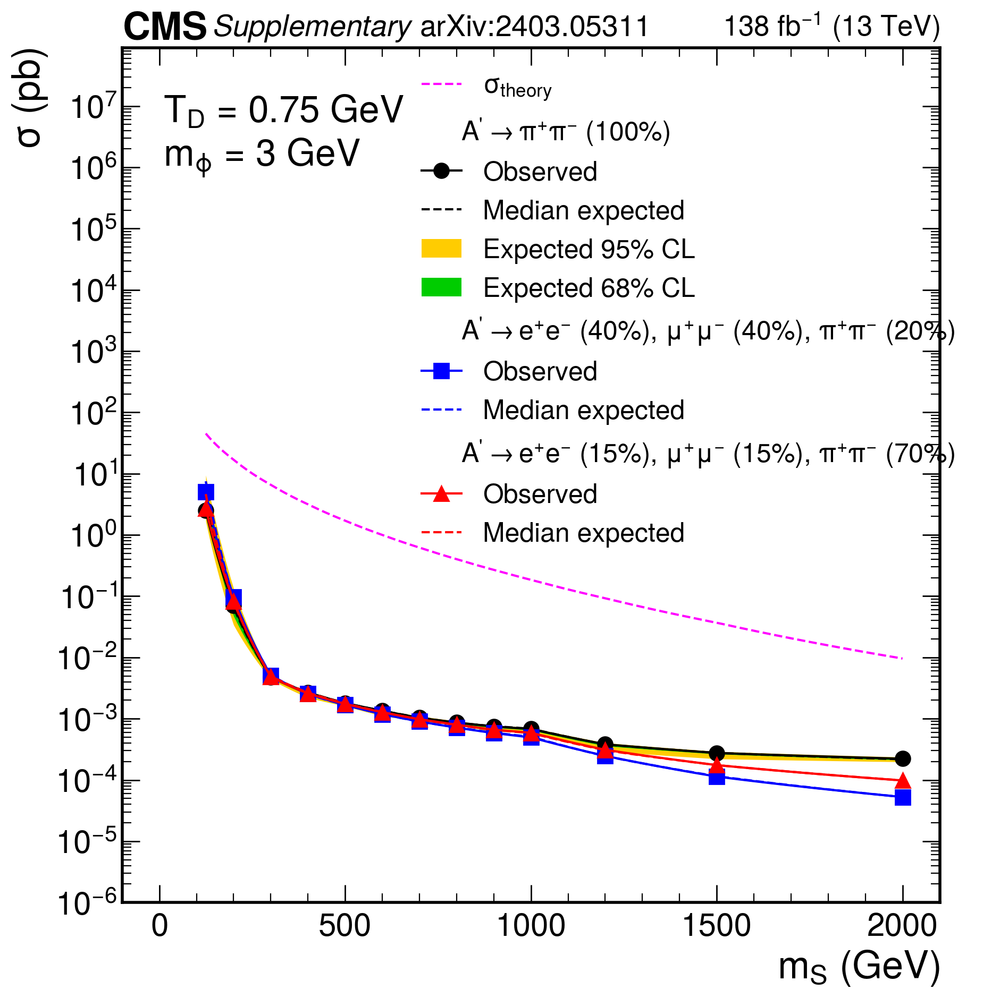

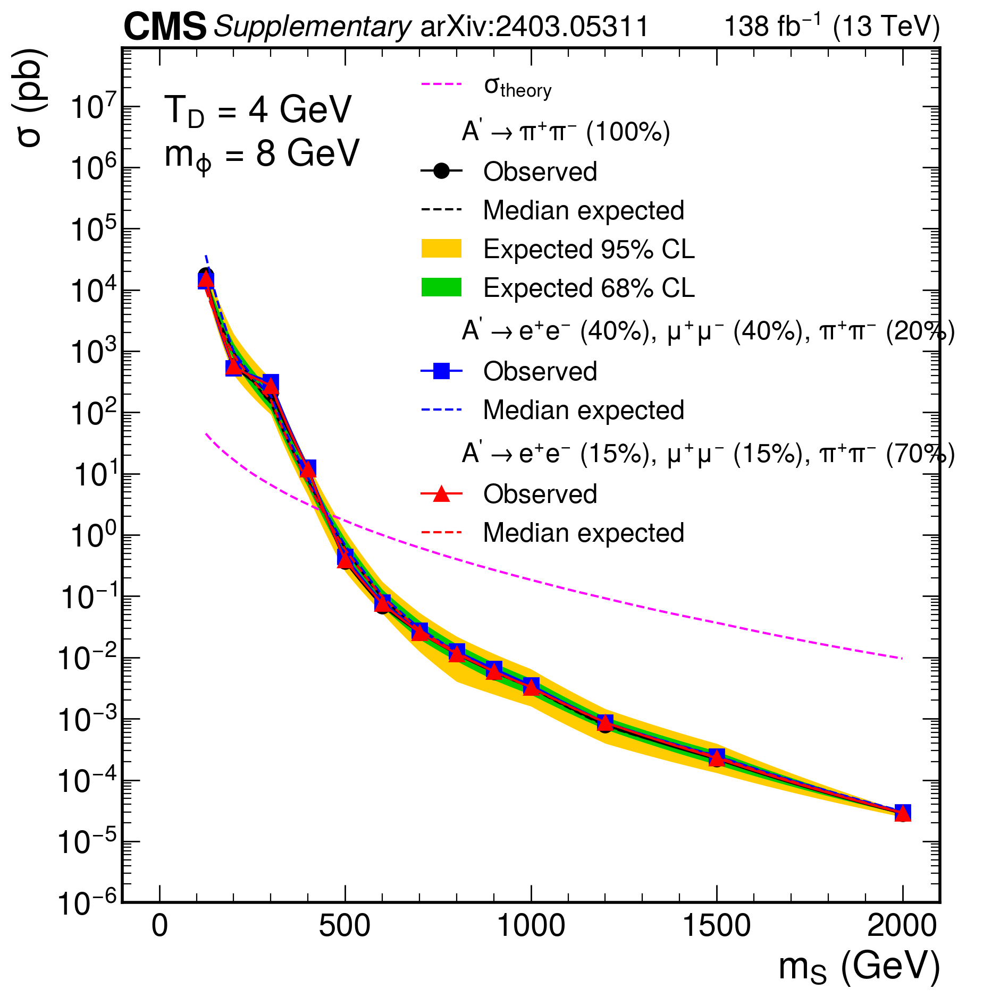

In [9]:
# example usage of the 1D limits mS scan
fig = utils.plot_ms_limits_all_decays(temp=3, mphi=3, ref_decay='generic', path=itag, verbose=False, method='HybridNew')
utils.savefig(fig, outDirPaper, 'Figure_003')
fig = utils.plot_ms_limits_all_decays(temp=0.75, mphi=3, ref_decay='generic', path=itag, verbose=False, method='HybridNew', cmsLabel=False)
hep.cms.label(data=True, label="$\it{Supplementary}$ arXiv:2403.05311", italic=(False, False, False), fontsize=20, lumi=utils.lumis['combined'], ax=fig.axes[0])
utils.savefig(fig, outDirSupp, 'Figure-aux_001-a')
fig = utils.plot_ms_limits_all_decays(temp=4, mphi=8, ref_decay='generic', path=itag, verbose=False, method='HybridNew', cmsLabel=False)
hep.cms.label(data=True, label="$\it{Supplementary}$ arXiv:2403.05311", italic=(False, False, False), fontsize=20, lumi=utils.lumis['combined'], ax=fig.axes[0])
utils.savefig(fig, outDirSupp, 'Figure-aux_001-b')


## 2D Limits: $m_{\phi}$, T scan

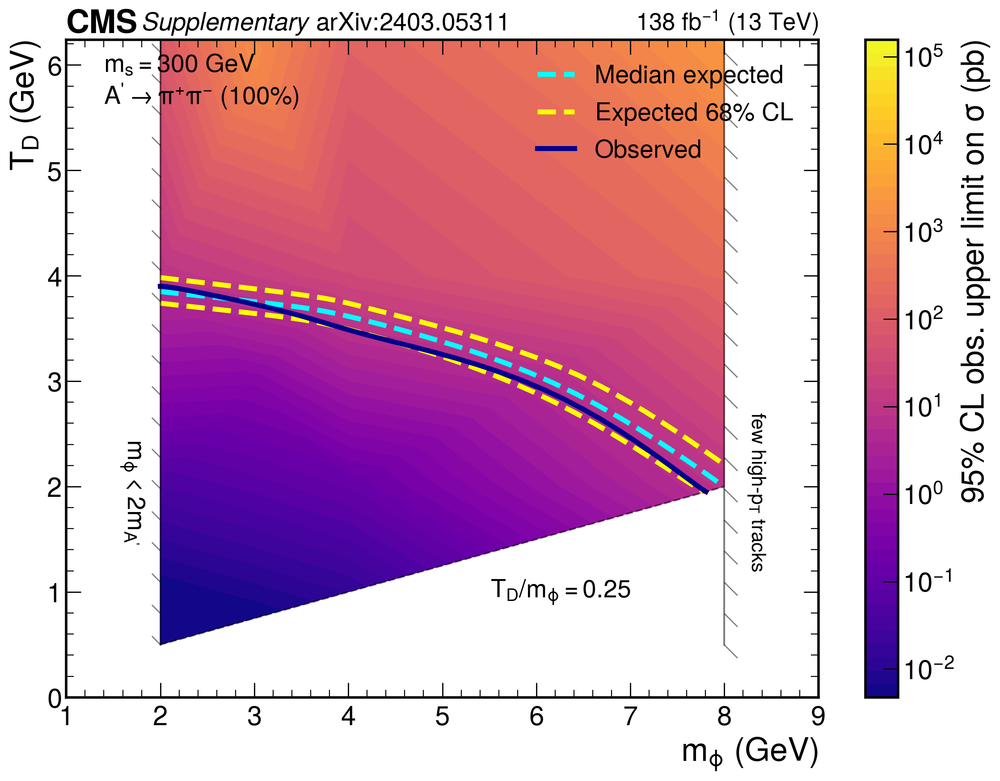

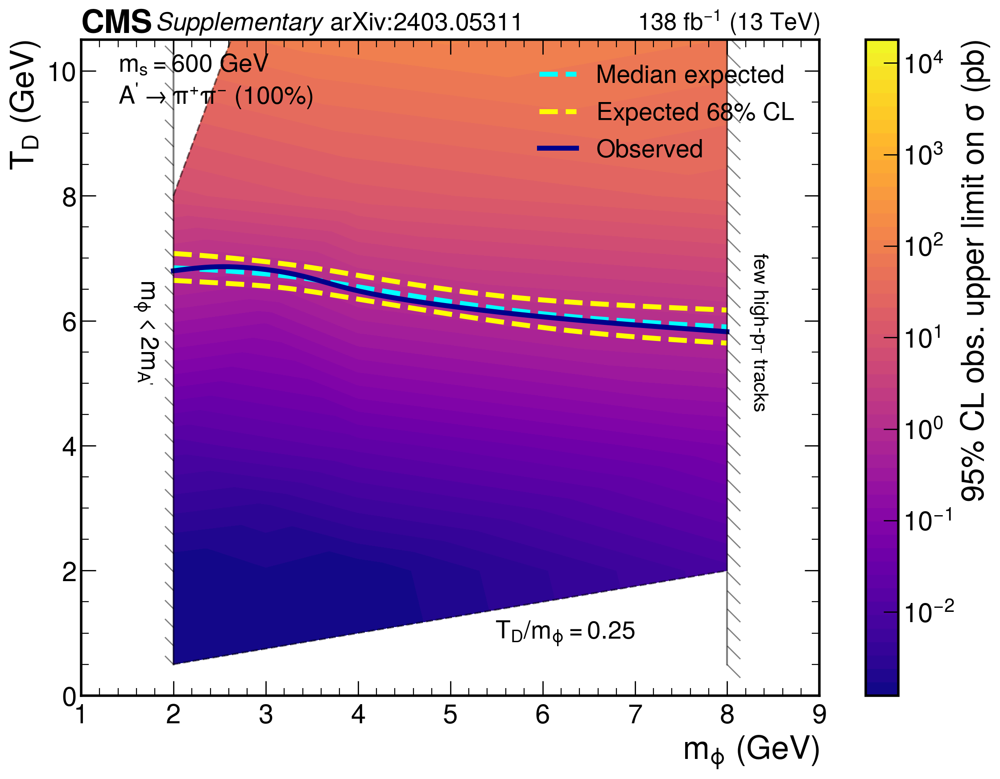

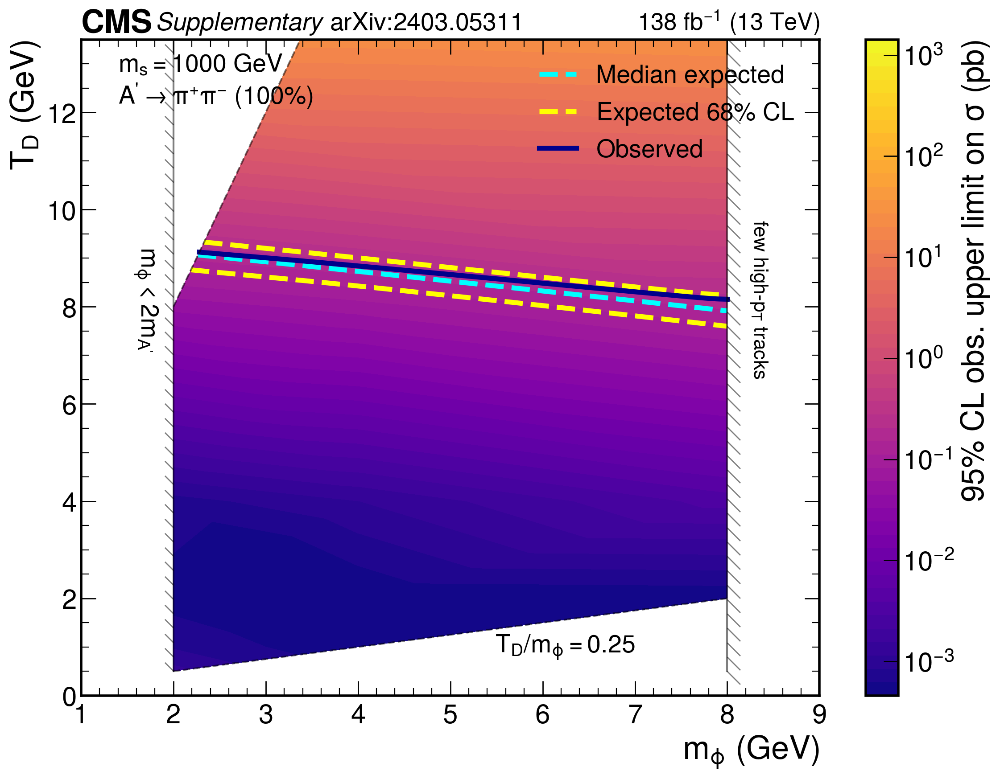

In [4]:
# example usage of the 2D limits function
fig = utils.plot_mPhi_temp_limits(ms=300, decay='generic', tricontour='log', path=itag, showPoints=False, method='HybridNew', showTheoryLines=True, cmsLabel=False)
hep.cms.label(data=True, label="$\it{Supplementary}$ arXiv:2403.05311", italic=(False, False, False), fontsize=20, lumi=utils.lumis['combined'], ax=fig.axes[0])
utils.savefig(fig, outDirSupp, 'Figure-aux_002-a')

fig = utils.plot_mPhi_temp_limits(ms=600, decay='generic', tricontour='log', path=itag, showPoints=False, method='HybridNew', showTheoryLines=True, cmsLabel=False)
fig.axes[0].set_ylim(0,10.5)
hep.cms.label(data=True, label="$\it{Supplementary}$ arXiv:2403.05311", italic=(False, False, False), fontsize=20, lumi=utils.lumis['combined'], ax=fig.axes[0])
utils.savefig(fig, outDirSupp, 'Figure-aux_002-b')

fig = utils.plot_mPhi_temp_limits(ms=1000, decay='generic', tricontour='log', path=itag, showPoints=False, method='HybridNew', showTheoryLines=True, cmsLabel=False)
fig.axes[0].set_ylim(0,13.5)
hep.cms.label(data=True, label="$\it{Supplementary}$ arXiv:2403.05311", italic=(False, False, False), fontsize=20, lumi=utils.lumis['combined'], ax=fig.axes[0])
utils.savefig(fig, outDirSupp, 'Figure-aux_002-c')

In [32]:
# return all combinations of (mS, decay)
combinations = utils.get_unique_combinations(['mphi', 'temp'])

for i, combination in enumerate(combinations):
    try:
        fig = utils.plot_mPhi_temp_limits(ms=combination[0], decay=combination[1], tricontour='log', path=itag)

        if combination[0] < 150:
            fig.axes[0].set_ylim(0, 2)
            fig.axes[0].set_xlim(right=4)
        elif combination[0] < 350:
            fig.axes[0].set_ylim(0, 5)
        elif combination[0] < 650:
            fig.axes[0].set_ylim(0, 10)
        elif combination[0] < 1050:
            fig.axes[0].set_ylim(5, 15)
        else:
            fig.axes[0].set_ylim(10, 35)

        utils.savefig(fig, outDir)
    except Exception as e:
        print("Combination failed", e)
    if saveToAN: utils.savefig(fig, outDirAN)
    if saveToPaper: utils.savefig(fig, outDirPaper)

    plt.close()

'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None
'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None
'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None
'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None
'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None
'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None
'path' must be a string, pathlib.P

## Summary plots: $m_{\phi}$, T scan with $\mu$=1 lines for each $m_S$

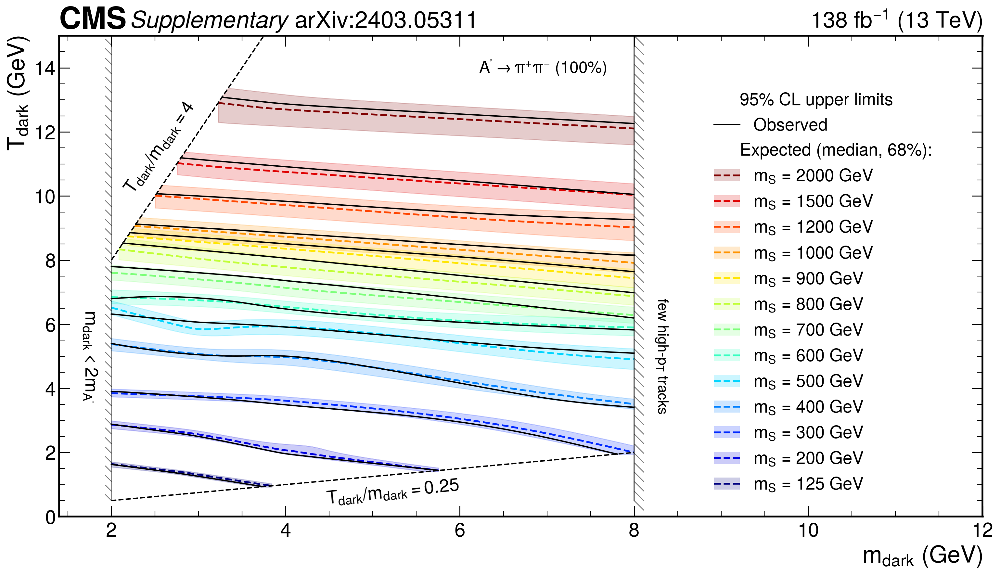

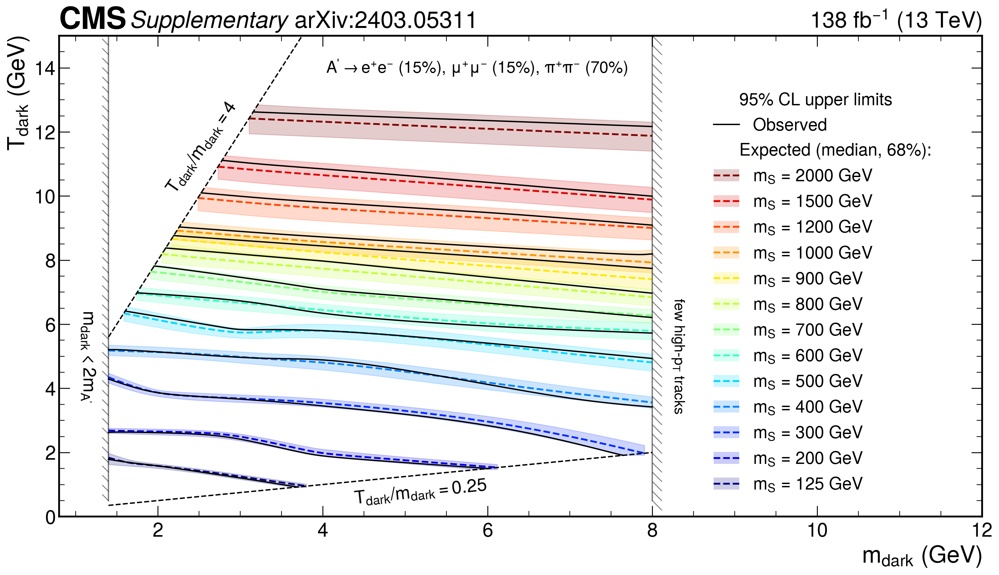

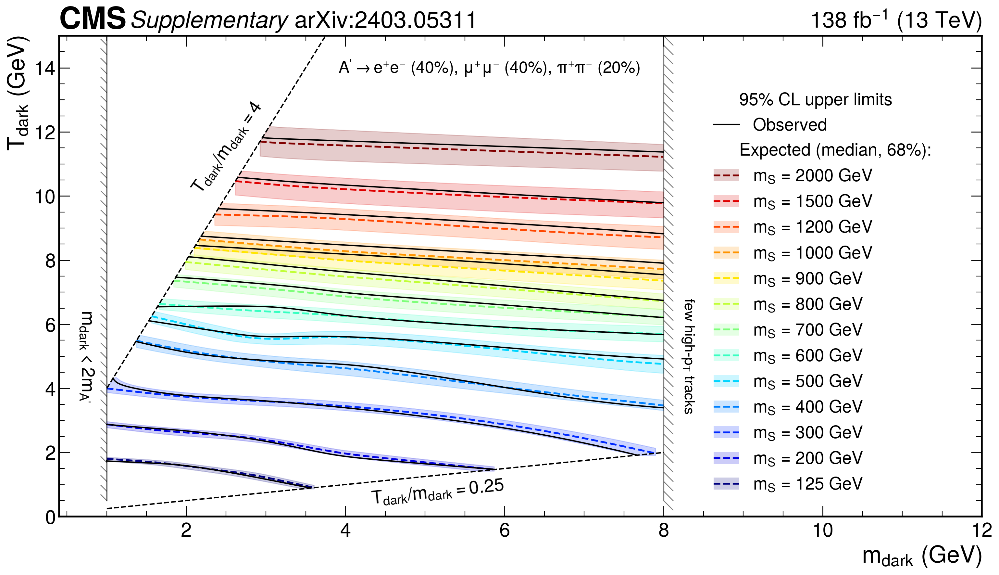

In [7]:
# example usage
fig = utils.plot_summary_limits_mPhi_temp(decay='generic', path='../approval_higherPrecision/', method='HybridNew', cmsLabel=False)
hep.cms.label(data=True, label="$\it{Supplementary}$ arXiv:2403.05311", italic=(False, False, False), lumi=utils.lumis['combined'], ax=fig.axes[0])
utils.savefig(fig, outDirPaper, "Figure_004")

fig = utils.plot_summary_limits_mPhi_temp(decay='hadronic', path='../approval_higherPrecision/', method='HybridNew', cmsLabel=False)
hep.cms.label(data=True, label="$\it{Supplementary}$ arXiv:2403.05311", italic=(False, False, False), lumi=utils.lumis['combined'], ax=fig.axes[0])
utils.savefig(fig, outDirSupp, "Figure-aux_003")

fig = utils.plot_summary_limits_mPhi_temp(decay='leptonic', path='../approval_higherPrecision/', method='HybridNew', cmsLabel=False)
hep.cms.label(data=True, label="$\it{Supplementary}$ arXiv:2403.05311", italic=(False, False, False), lumi=utils.lumis['combined'], ax=fig.axes[0])
utils.savefig(fig, outDirSupp, "Figure-aux_004")

'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit ../approval_higherPrecision/higgsCombineGluGluToSUEP_HT1000_T2p00_mS125.000_mPhi4.000_T2.000_modeleptonic_TuneCP5_13TeV-pythia8.HybridNew.mH125.root
'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None
'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None
'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None
'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None
'path' must be a string, pathlib.Path, an object wi

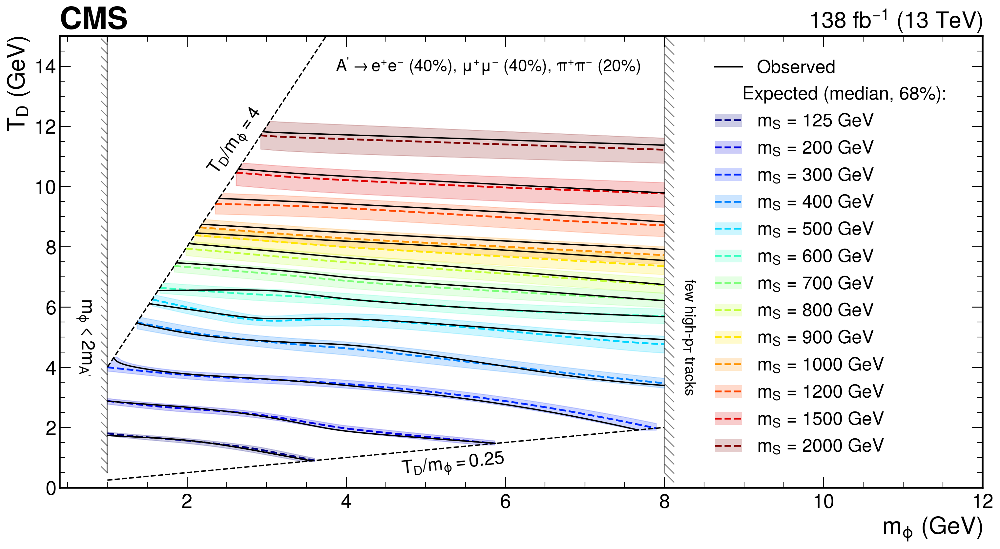

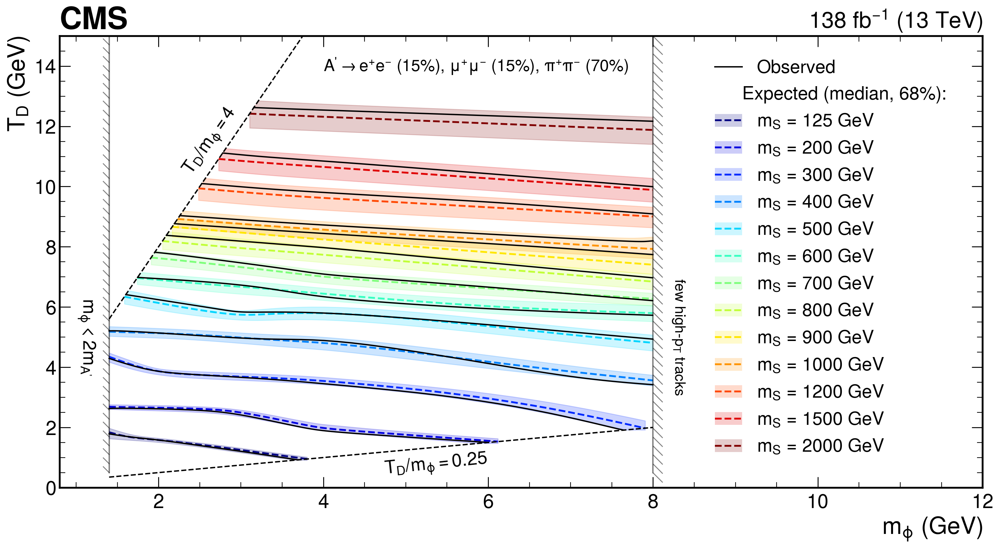

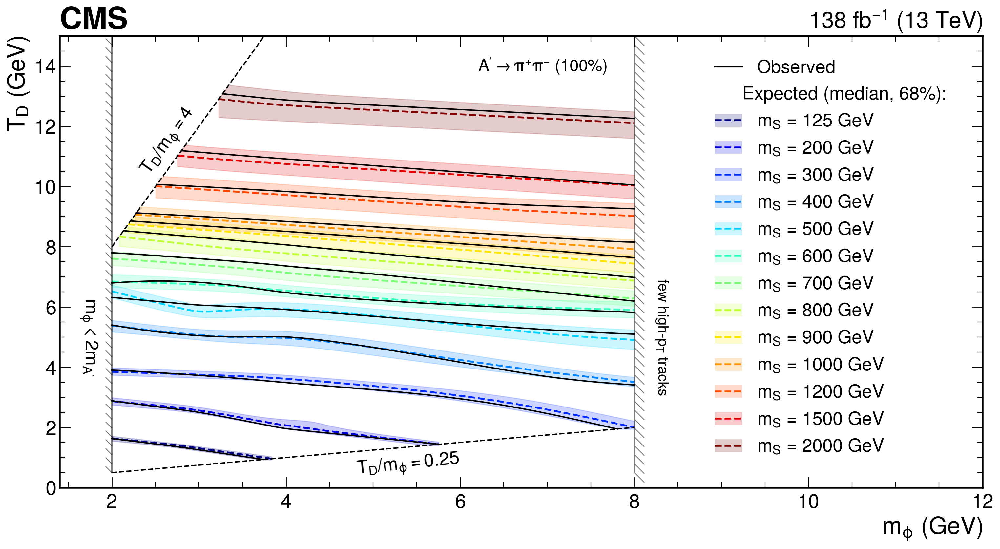

In [5]:
# over-engineered looping over the three decays :)
combinations = utils.get_unique_combinations(['ms','mphi','temp'])

for combination in combinations:
    try:
        fig = utils.plot_summary_limits_mPhi_temp(decay=combination[0], path=itag, method='HybridNew')    
    except Exception as e:
        print("Combination failed", e)
    utils.savefig(fig, outDir)
    if saveToAN: utils.savefig(fig, outDirAN)
    if saveToPaper: utils.savefig(fig, outDirPaper)

## 2D Limits: $m_S, T_D$ scan

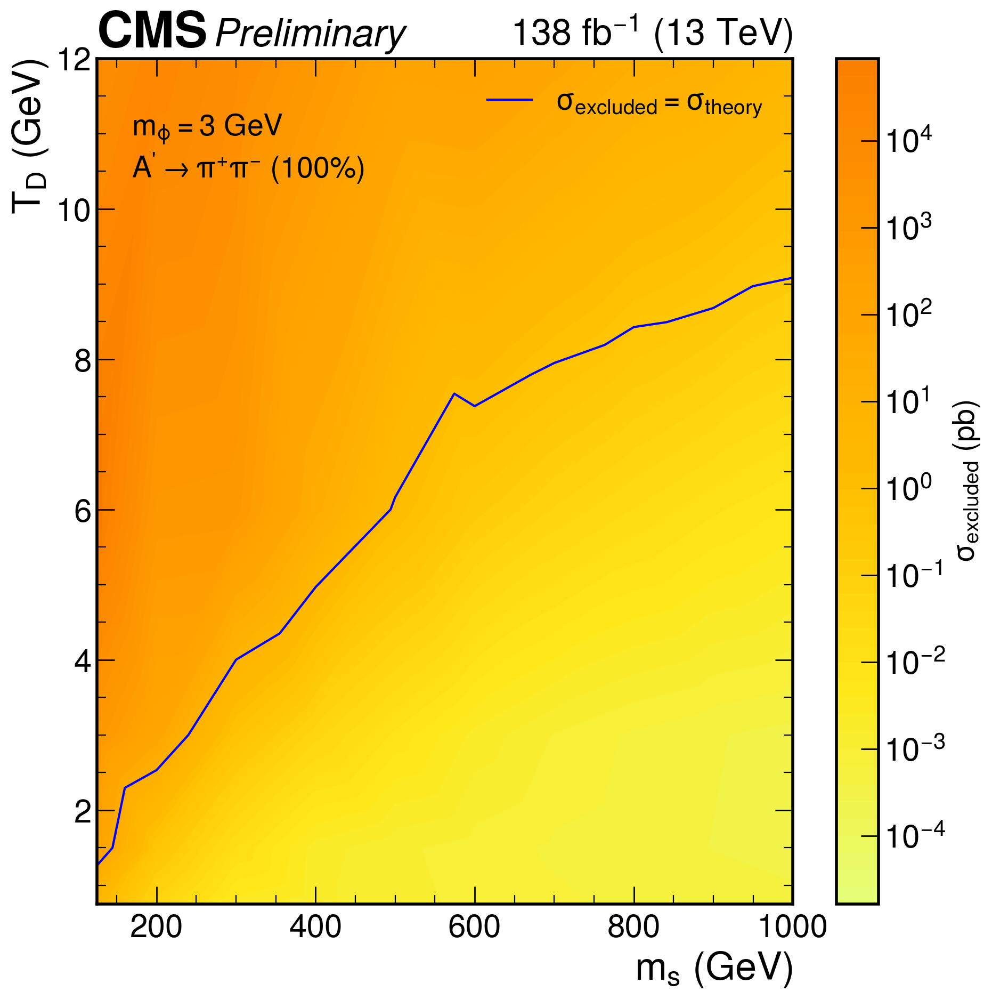

In [4]:
# example usage
fig = utils.plot_xsec_limits(mphi=3, decay='generic', path=itag)
utils.savefig(fig, outDir)

In [21]:
# return all combinations of (mphi, decay)
combinations = utils.get_unique_combinations(['ms', 'temp'])

for i, combination in enumerate(combinations):
    try:
        fig = utils.plot_xsec_limits(mphi=combination[0], decay=combination[1], path=itag)
    except Exception as e:
        print("Combination failed", e)
    utils.savefig(fig, outDir)
    if saveToAN: utils.savefig(fig, outDirAN)
    if saveToPaper: utils.savefig(fig, outDirPaper)

    plt.close()

[1.0, 'leptonic']
[1.4, 'hadronic']
[2.0, 'generic']
[2.0, 'leptonic']
[2.0, 'hadronic']
[3.0, 'generic']
[3.0, 'leptonic']
Bad limits ../allYears_720_v5/higgsCombineGluGluToSUEP_HT1000_T12p0_mS125.000_mPhi3.000_T12.000_modeleptonic_TuneCP5_13TeV-pythia8.AsymptoticLimits.mH125.root
[3.0, 'hadronic']
[4.0, 'generic']
Bad limits ../allYears_720_v5/higgsCombineGluGluToSUEP_HT1000_T16p0_mS125.000_mPhi4.000_T16.000_modegeneric_TuneCP5_13TeV-pythia8.AsymptoticLimits.mH125.root
[4.0, 'leptonic']
[4.0, 'hadronic']
[8.0, 'generic']
Bad limits ../allYears_720_v5/higgsCombineGluGluToSUEP_HT1000_T32p0_mS125.000_mPhi8.000_T32.000_modegeneric_TuneCP5_13TeV-pythia8.AsymptoticLimits.mH125.root
Bad limits ../allYears_720_v5/higgsCombineGluGluToSUEP_HT1000_T32p0_mS200.000_mPhi8.000_T32.000_modegeneric_TuneCP5_13TeV-pythia8.AsymptoticLimits.mH125.root
[8.0, 'leptonic']
Bad limits ../allYears_720_v5/higgsCombineGluGluToSUEP_HT1000_T16p0_mS125.000_mPhi8.000_T16.000_modeleptonic_TuneCP5_13TeV-pythia8.Asympt

## Summary plots: $m_{S}$, T scan with $\mu$=1 lines for each $m_{\phi}$

'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None
'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None
'path' must be a string, pathlib.Path, an object with 'read' and 'seek' methods, or a length-1 dict of {file_path: object_path}, not None
File doesn't exit None


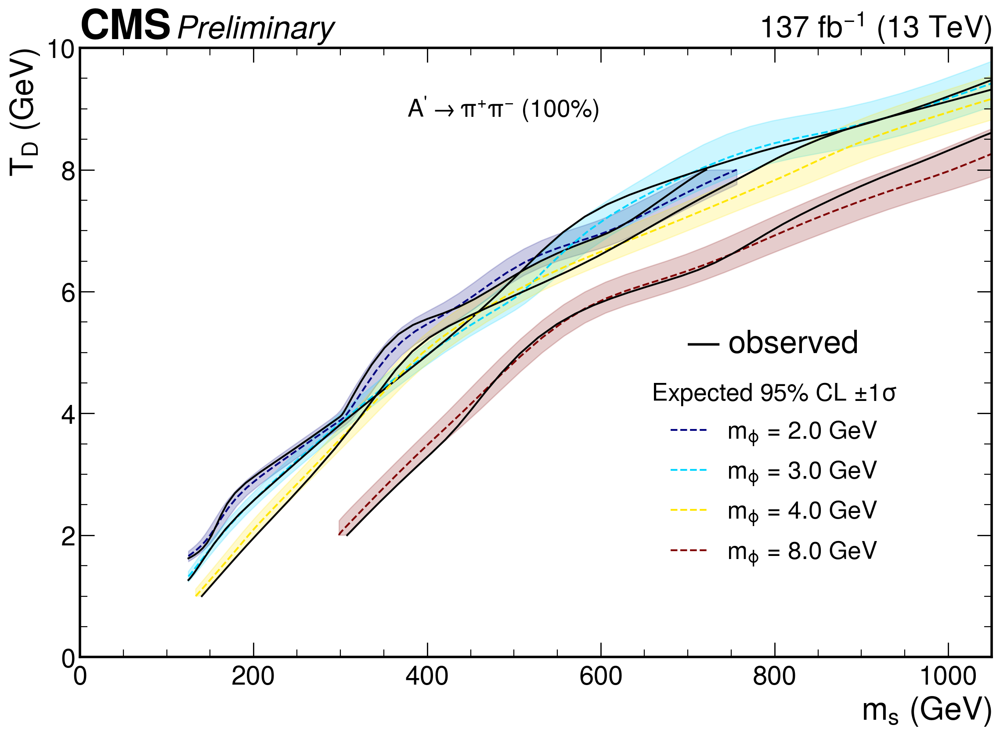

In [4]:
# example usage
fig = utils.plot_summary_limits_mS_temp(decay='generic', path=itag)
utils.savefig(fig, outDir)

['leptonic']
Bad limits ../allYears_720_v5/higgsCombineGluGluToSUEP_HT1000_T12p0_mS125.000_mPhi3.000_T12.000_modeleptonic_TuneCP5_13TeV-pythia8.AsymptoticLimits.mH125.root
Bad limits ../allYears_720_v5/higgsCombineGluGluToSUEP_HT1000_T16p0_mS125.000_mPhi8.000_T16.000_modeleptonic_TuneCP5_13TeV-pythia8.AsymptoticLimits.mH125.root
Bad limits ../allYears_720_v5/higgsCombineGluGluToSUEP_HT1000_T32p0_mS125.000_mPhi8.000_T32.000_modeleptonic_TuneCP5_13TeV-pythia8.AsymptoticLimits.mH125.root
Bad limits ../allYears_720_v5/higgsCombineGluGluToSUEP_HT1000_T32p0_mS200.000_mPhi8.000_T32.000_modeleptonic_TuneCP5_13TeV-pythia8.AsymptoticLimits.mH125.root
Combination failed [Errno 2] No such file or directory: '/home/submit/lavezzo/public_html/SUEP/analysis/allYears_720_v5/2D_summary_limits_leptonic_mPhi.pdf'
['hadronic']
Bad limits ../allYears_720_v5/higgsCombineGluGluToSUEP_HT1000_T16p0_mS125.000_mPhi8.000_T16.000_modehadronic_TuneCP5_13TeV-pythia8.AsymptoticLimits.mH125.root
Bad limits ../allYears

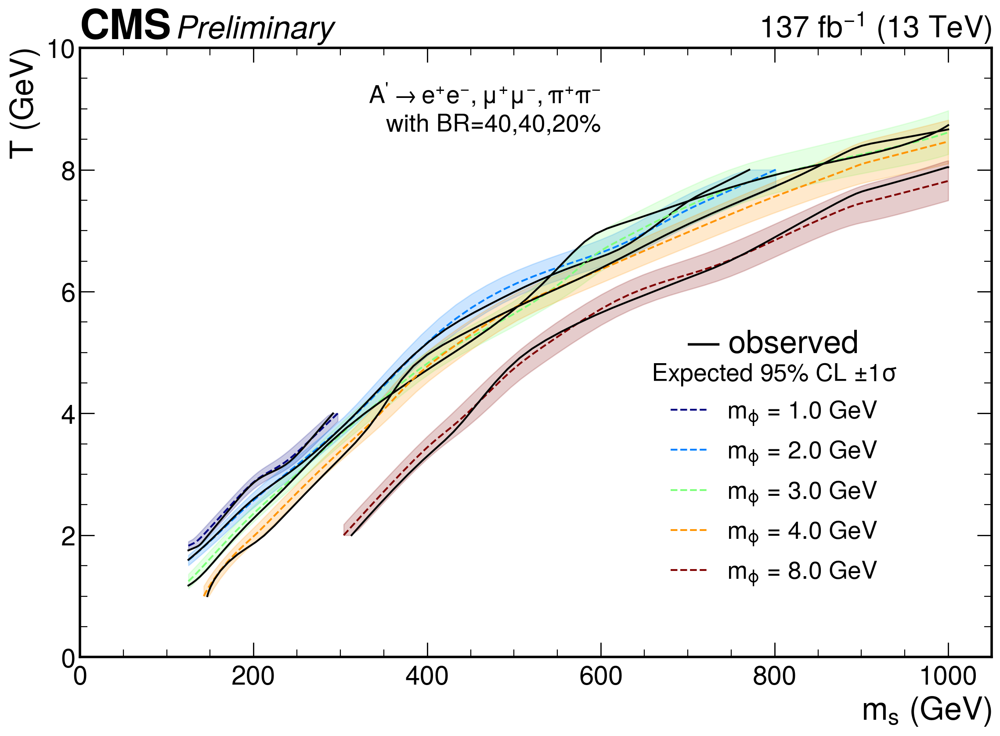

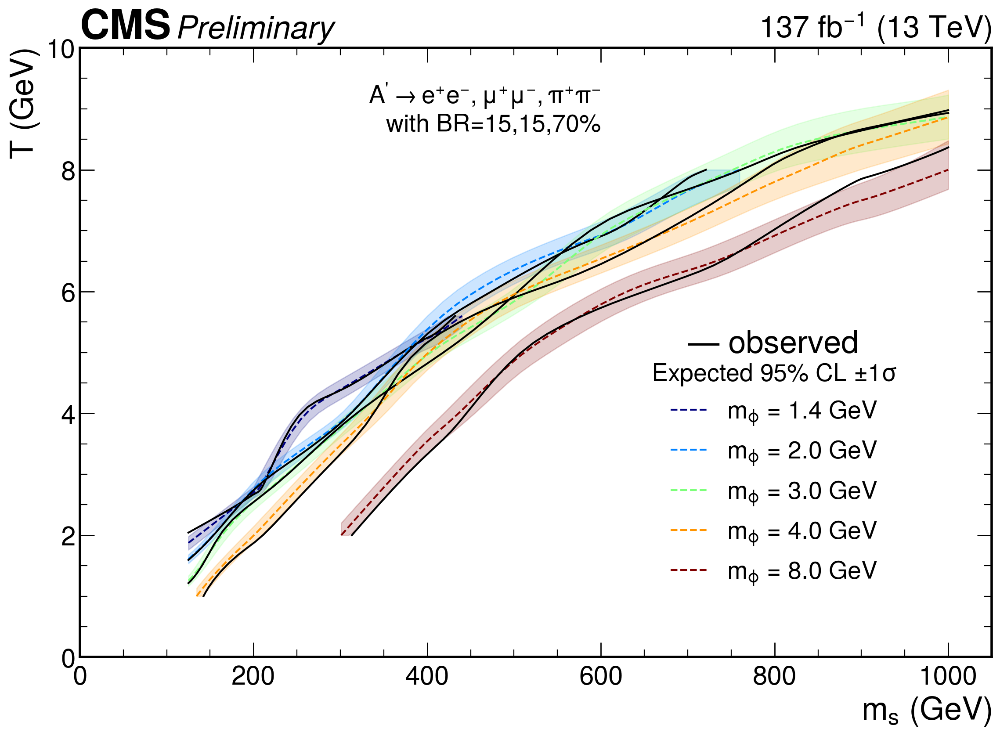

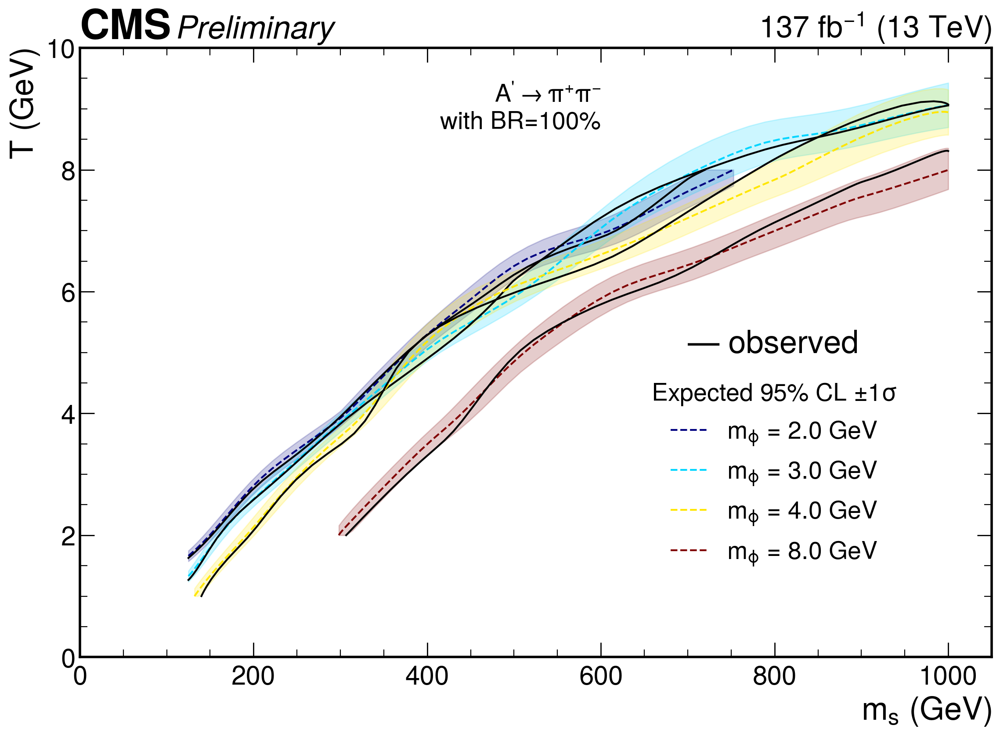

In [8]:
# over-engineered looping over the three decays :)
combinations = utils.get_unique_combinations(['ms','mphi','temp'])

for combination in combinations:
    try:
        fig = utils.plot_summary_limits_mS_temp(decay=combination[0], path=itag)
    except Exception as e:
        print("Combination failed", e)
    utils.savefig(fig, outDir)
    if saveToAN: utils.savefig(fig, outDirAN)
    if saveToPaper: utils.savefig(fig, outDirPaper)